<a href="https://colab.research.google.com/github/weedge/doraemon-nb/blob/main/f5_tts.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!git clone https://github.com/SWivid/F5-TTS.git
%cd F5-TTS

Cloning into 'F5-TTS'...
remote: Enumerating objects: 2308, done.
remote: Counting objects: 100% (535/535), done.
remote: Compressing objects: 100% (129/129), done.
remote: Total 2308 (delta 457), reused 406 (delta 406), pack-reused 1773 (from 3)
Receiving objects: 100% (2308/2308), 1.86 MiB | 6.01 MiB/s, done.
Resolving deltas: 100% (1415/1415), done.
/content/F5-TTS


# inference

In [ ]:
!pip install -q git+https://github.com/SWivid/F5-TTS.git


In [ ]:
import random
import sys
from importlib.resources import files

import soundfile as sf
import tqdm
from cached_path import cached_path

from f5_tts.infer.utils_infer import (
    hop_length,
    infer_process,
    load_model,
    load_vocoder,
    preprocess_ref_audio_text,
    remove_silence_for_generated_wav,
    save_spectrogram,
    transcribe,
    target_sample_rate,
)
from f5_tts.model import DiT, UNetT
from f5_tts.model.utils import seed_everything


class F5TTS:
    def __init__(
        self,
        model_type="F5-TTS",
        ckpt_file="",
        vocab_file="",
        ode_method="euler",
        use_ema=True,
        vocoder_name="vocos",
        local_path=None,
        device=None,
        hf_cache_dir=None,
    ):
        # Initialize parameters
        self.final_wave = None
        self.target_sample_rate = target_sample_rate
        self.hop_length = hop_length
        self.seed = -1
        self.mel_spec_type = vocoder_name

        # Set device
        if device is not None:
            self.device = device
        else:
            import torch

            self.device = "cuda" if torch.cuda.is_available() else "mps" if torch.backends.mps.is_available() else "cpu"

        # Load models
        self.load_vocoder_model(vocoder_name, local_path=local_path, hf_cache_dir=hf_cache_dir)
        self.load_ema_model(
            model_type, ckpt_file, vocoder_name, vocab_file, ode_method, use_ema, hf_cache_dir=hf_cache_dir
        )

    def load_vocoder_model(self, vocoder_name, local_path=None, hf_cache_dir=None):
        self.vocoder = load_vocoder(vocoder_name, local_path is not None, local_path, self.device, hf_cache_dir)

    def load_ema_model(self, model_type, ckpt_file, mel_spec_type, vocab_file, ode_method, use_ema, hf_cache_dir=None):
        if model_type == "F5-TTS":
            if not ckpt_file:
                if mel_spec_type == "vocos":
                    ckpt_file = str(
                        cached_path("hf://SWivid/F5-TTS/F5TTS_Base/model_1200000.safetensors", cache_dir=hf_cache_dir)
                    )
                elif mel_spec_type == "bigvgan":
                    ckpt_file = str(
                        cached_path("hf://SWivid/F5-TTS/F5TTS_Base_bigvgan/model_1250000.pt", cache_dir=hf_cache_dir)
                    )
            model_cfg = dict(dim=1024, depth=22, heads=16, ff_mult=2, text_dim=512, conv_layers=4)
            model_cls = DiT
        elif model_type == "E2-TTS":
            if not ckpt_file:
                ckpt_file = str(
                    cached_path("hf://SWivid/E2-TTS/E2TTS_Base/model_1200000.safetensors", cache_dir=hf_cache_dir)
                )
            model_cfg = dict(dim=1024, depth=24, heads=16, ff_mult=4)
            model_cls = UNetT
        else:
            raise ValueError(f"Unknown model type: {model_type}")

        self.ema_model = load_model(
            model_cls, model_cfg, ckpt_file, mel_spec_type, vocab_file, ode_method, use_ema, self.device
        )

    def transcribe(self, ref_audio, language=None):
        return transcribe(ref_audio, language)

    def export_wav(self, wav, file_wave, remove_silence=False):
        sf.write(file_wave, wav, self.target_sample_rate)

        if remove_silence:
            remove_silence_for_generated_wav(file_wave)

    def export_spectrogram(self, spect, file_spect):
        save_spectrogram(spect, file_spect)

    def infer(
        self,
        ref_file,
        ref_text,
        gen_text,
        show_info=print,
        progress=tqdm,
        target_rms=0.1,
        cross_fade_duration=0.15,
        sway_sampling_coef=-1,
        cfg_strength=2,
        nfe_step=32,
        speed=1.0,
        fix_duration=None,
        remove_silence=False,
        file_wave=None,
        file_spect=None,
        seed=-1,
    ):
        if seed == -1:
            seed = random.randint(0, sys.maxsize)
        seed_everything(seed)
        self.seed = seed

        ref_file, ref_text = preprocess_ref_audio_text(ref_file, ref_text, device=self.device)

        wav, sr, spect = infer_process(
            ref_file,
            ref_text,
            gen_text,
            self.ema_model,
            self.vocoder,
            self.mel_spec_type,
            show_info=show_info,
            progress=progress,
            target_rms=target_rms,
            cross_fade_duration=cross_fade_duration,
            nfe_step=nfe_step,
            cfg_strength=cfg_strength,
            sway_sampling_coef=sway_sampling_coef,
            speed=speed,
            fix_duration=fix_duration,
            device=self.device,
        )

        if file_wave is not None:
            self.export_wav(wav, file_wave, remove_silence)

        if file_spect is not None:
            self.export_spectrogram(spect, file_spect)

        return wav, sr, spect

Building prefix dict from the default dictionary ...
DEBUG:jieba:Building prefix dict from the default dictionary ...
Dumping model to file cache /tmp/jieba.cache
DEBUG:jieba:Dumping model to file cache /tmp/jieba.cache
Loading model cost 0.714 seconds.
DEBUG:jieba:Loading model cost 0.714 seconds.
Prefix dict has been built successfully.
DEBUG:jieba:Prefix dict has been built successfully.


Word segmentation module jieba initialized.



In [35]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

In [36]:
!mkdir -p ./tests

In [ ]:
f5tts = F5TTS()
wav, sr, spect = f5tts.infer(
  ref_file="./src/f5_tts/infer/examples/basic/basic_ref_en.wav",
  ref_text="some call me nature, others call me mother nature.",
  gen_text="""I don't really care what you call me. I've been a silent spectator, watching species evolve, empires rise and fall. But always remember, I am mighty and enduring. Respect me and I'll nurture you; ignore me and you shall face the consequences.""",
  file_wave="./tests/api_out.wav",
  file_spect="./tests/api_out.png",
  seed=-1,  # random seed = -1
)
print("seed :", f5tts.seed)

Download Vocos from huggingface charactr/vocos-mel-24khz

vocab :  /usr/local/lib/python3.10/dist-packages/f5_tts/infer/examples/vocab.txt
token :  custom
model :  /root/.cache/huggingface/hub/models--SWivid--F5-TTS/snapshots/4dcc16f297f2ff98a17b3726b16f5de5a5e45672/F5TTS_Base/model_1200000.safetensors 

Converting audio...
Using custom reference text...

ref_text   some call me nature, others call me mother nature. 
gen_text 0 I don't really care what you call me. I've been a silent spectator, watching species evolve, empires rise and fall. But always remember, I am mighty and enduring.
gen_text 1 Respect me and I'll nurture you; ignore me and you shall face the consequences.


Generating audio in 2 batches...


100%|██████████| 2/2 [00:09<00:00,  4.58s/it]


seed : 7181534271943507071


In [ ]:
from IPython.display import Audio
Audio("./tests/api_out.wav")

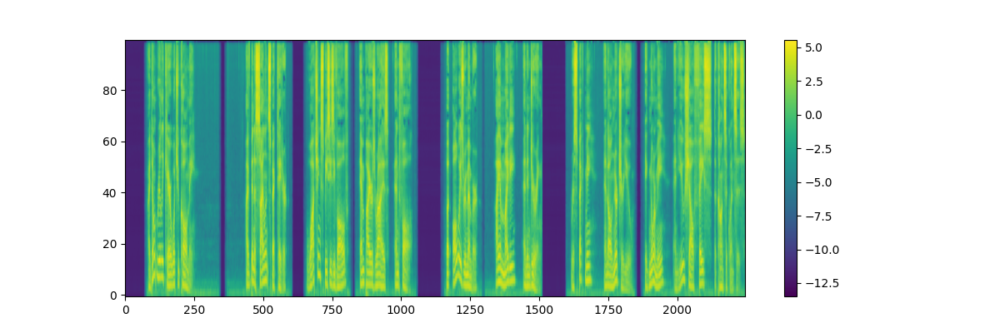

In [ ]:
from IPython.display import Image
Image("./tests/api_out.png")

In [ ]:
f5tts = F5TTS()
wav, sr, spect = f5tts.infer(
  ref_file="",
  ref_text="",
  gen_text="""本文介绍了 F5-TTS，这是一种基于扩散变压器 (DiT) 流匹配的完全非自回归文本转语音系统。不需要时长模型、文本编码器、音素对齐等复杂的设计，只需将文本输入用填充标记填充到与输入语音相同的长度，然后进行去噪以进行语音生成，这最初被E2证明是可行的语音合成。然而，E2 TTS 的原始设计由于收敛速度慢、鲁棒性低而难以遵循。为了解决这些问题，我们首先使用 ConvNeXt 对输入进行建模，以细化文本表示，使其易于与语音对齐。我们进一步提出了一种推理时间摇摆采样策略，该策略显着提高了我们模型的性能和效率。这种流步骤的采样策略可以轻松应用于现有的基于流匹配的模型，而无需重新训练。我们的设计可以实现更快的训练，并实现 0.15 的推理 RTF，与最先进的基于扩散的 TTS 模型相比，有了很大的改进。我们的 Fairytaler Fakes Fluent and Faithful 语音与流匹配 (F5-TTS) 在公共 100K 小时多语言数据集上进行训练，表现出高度自然和富有表现力的零样本能力、无缝代码切换能力和速度控制效率。演示示例可以在https://SWivid.github.io/F5-TTS找到。我们发布所有代码和检查点以促进社区发展""",
  file_wave="./tests/api_out_zh.wav",
  file_spect="./tests/api_out_zh.png",
  seed=-1,  # random seed = -1
)
print("seed :", f5tts.seed)

In [ ]:
from IPython.display import Audio
Audio("./tests/api_out_zh.wav")

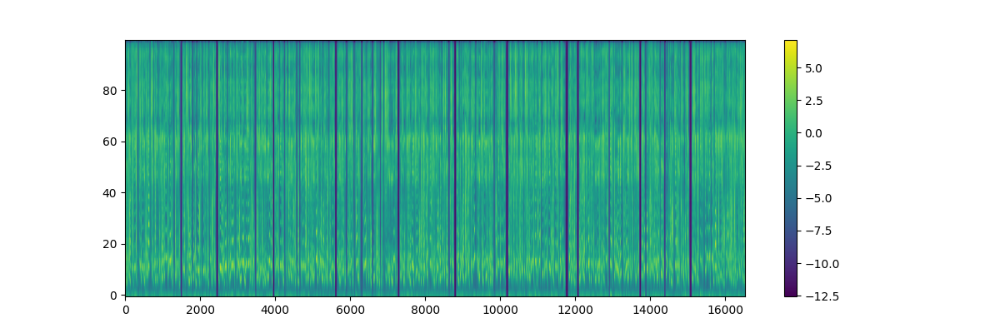

In [ ]:
from IPython.display import Image
Image("./tests/api_out_zh.png")

## batch stream inference

In [19]:
import argparse
import gc
import socket
import struct
import torch
import torchaudio
import traceback
from importlib.resources import files
from threading import Thread

from cached_path import cached_path

from f5_tts.infer.utils_infer import infer_batch_process, preprocess_ref_audio_text, load_vocoder, load_model
from f5_tts.model.backbones.dit import DiT


class TTSStreamingProcessor:
    def __init__(self, ckpt_file, vocab_file, ref_audio, ref_text, device=None, dtype=torch.float32):
        self.device = device or (
            "cuda" if torch.cuda.is_available() else "mps" if torch.backends.mps.is_available() else "cpu"
        )

        # Load the model using the provided checkpoint and vocab files
        self.model = load_model(
            model_cls=DiT,
            model_cfg=dict(dim=1024, depth=22, heads=16, ff_mult=2, text_dim=512, conv_layers=4),
            ckpt_path=ckpt_file,
            mel_spec_type="vocos",  # or "bigvgan" depending on vocoder
            vocab_file=vocab_file,
            ode_method="euler",
            use_ema=True,
            device=self.device,
        ).to(self.device, dtype=dtype)

        # Load the vocoder
        self.vocoder = load_vocoder(is_local=False)

        # Set sampling rate for streaming
        self.sampling_rate = 24000  # Consistency with client

        # Set reference audio and text
        self.ref_audio = ref_audio
        self.ref_text = ref_text

        # Warm up the model
        self._warm_up()

    def _warm_up(self):
        """Warm up the model with a dummy input to ensure it's ready for real-time processing."""
        print("Warming up the model...")
        ref_audio, ref_text = preprocess_ref_audio_text(self.ref_audio, self.ref_text)
        audio, sr = torchaudio.load(ref_audio)
        gen_text = "Warm-up text for the model."

        # Pass the vocoder as an argument here
        infer_batch_process((audio, sr), ref_text, [gen_text], self.model, self.vocoder, device=self.device)
        print("Warm-up completed.")

    def generate_stream(self, text, play_steps_in_s=0.5):
        """Generate audio in chunks and yield them in real-time."""
        # Preprocess the reference audio and text
        ref_audio, ref_text = preprocess_ref_audio_text(self.ref_audio, self.ref_text)

        # Load reference audio
        audio, sr = torchaudio.load(ref_audio)

        # Run inference for the input text
        audio_chunk, final_sample_rate, spectrogram = infer_batch_process(
            (audio, sr),
            ref_text,
            [text],
            self.model,
            self.vocoder,
            device=self.device,  # Pass vocoder here
        )

        # Break the generated audio into chunks and send them
        chunk_size = int(final_sample_rate * play_steps_in_s)

        if len(audio_chunk) < chunk_size:
            yield audio_chunk
            return

        for i in range(0, len(audio_chunk), chunk_size):
            chunk = audio_chunk[i : i + chunk_size]

            # Check if it's the final chunk
            if i + chunk_size >= len(audio_chunk):
                chunk = audio_chunk[i:]

            # Send the chunk if it is not empty
            if len(chunk) > 0:
                yield chunk


In [20]:
import tqdm
import numpy as np

from huggingface_hub import snapshot_download, hf_hub_download
from pydub import AudioSegment, silence
#from transformers import pipeline
from vocos import Vocos

from f5_tts.model import CFM
from f5_tts.model.utils import (
    get_tokenizer,
    convert_char_to_pinyin,
)

_ref_audio_cache = {}

device = "cuda" if torch.cuda.is_available() else "mps" if torch.backends.mps.is_available() else "cpu"

# -----------------------------------------

target_sample_rate = 24000
n_mel_channels = 100
hop_length = 256
win_length = 1024
n_fft = 1024
mel_spec_type = "vocos"
target_rms = 0.1
cross_fade_duration = 0.15
ode_method = "euler"
nfe_step = 32  # 16, 32
cfg_strength = 2.0
sway_sampling_coef = -1.0
speed = 1.0
fix_duration = None


def infer_batch_process(
    ref_audio,
    ref_text,
    gen_text_batches,
    model_obj,
    vocoder,
    mel_spec_type="vocos",
    progress=tqdm,
    target_rms=0.1,
    cross_fade_duration=0.15,
    nfe_step=32,
    cfg_strength=2.0,
    sway_sampling_coef=-1,
    speed=1,
    fix_duration=None,
    device=None,
):
    audio, sr = ref_audio
    if audio.shape[0] > 1:
        audio = torch.mean(audio, dim=0, keepdim=True)

    rms = torch.sqrt(torch.mean(torch.square(audio)))
    if rms < target_rms:
        audio = audio * target_rms / rms
    if sr != target_sample_rate:
        resampler = torchaudio.transforms.Resample(sr, target_sample_rate)
        audio = resampler(audio)
    audio = audio.to(device)

    generated_waves = []
    spectrograms = []

    if len(ref_text[-1].encode("utf-8")) == 1:
        ref_text = ref_text + " "
    for i, gen_text in enumerate(progress.tqdm(gen_text_batches)):
        # Prepare the text
        text_list = [ref_text + gen_text]
        final_text_list = convert_char_to_pinyin(text_list)

        ref_audio_len = audio.shape[-1] // hop_length
        if fix_duration is not None:
            duration = int(fix_duration * target_sample_rate / hop_length)
        else:
            # Calculate duration
            ref_text_len = len(ref_text.encode("utf-8"))
            gen_text_len = len(gen_text.encode("utf-8"))
            duration = ref_audio_len + int(ref_audio_len / ref_text_len * gen_text_len / speed)

        # inference
        with torch.inference_mode():
            generated, _ = model_obj.sample(
                cond=audio,
                text=final_text_list,
                duration=duration,
                steps=nfe_step,
                cfg_strength=cfg_strength,
                sway_sampling_coef=sway_sampling_coef,
            )

            generated = generated.to(torch.float32)
            generated = generated[:, ref_audio_len:, :]
            generated_mel_spec = generated.permute(0, 2, 1)
            if mel_spec_type == "vocos":
                generated_wave = vocoder.decode(generated_mel_spec)
            elif mel_spec_type == "bigvgan":
                generated_wave = vocoder(generated_mel_spec)
            if rms < target_rms:
                generated_wave = generated_wave * rms / target_rms

            # wav -> numpy
            generated_wave = generated_wave.squeeze().cpu().numpy()

            generated_waves.append(generated_wave)
            spectrograms.append(generated_mel_spec[0].cpu().numpy())

    # Combine all generated waves with cross-fading
    if cross_fade_duration <= 0:
        # Simply concatenate
        final_wave = np.concatenate(generated_waves)
    else:
        final_wave = generated_waves[0]
        for i in range(1, len(generated_waves)):
            prev_wave = final_wave
            next_wave = generated_waves[i]

            # Calculate cross-fade samples, ensuring it does not exceed wave lengths
            cross_fade_samples = int(cross_fade_duration * target_sample_rate)
            cross_fade_samples = min(cross_fade_samples, len(prev_wave), len(next_wave))

            if cross_fade_samples <= 0:
                # No overlap possible, concatenate
                final_wave = np.concatenate([prev_wave, next_wave])
                continue

            # Overlapping parts
            prev_overlap = prev_wave[-cross_fade_samples:]
            next_overlap = next_wave[:cross_fade_samples]

            # Fade out and fade in
            fade_out = np.linspace(1, 0, cross_fade_samples)
            fade_in = np.linspace(0, 1, cross_fade_samples)

            # Cross-faded overlap
            cross_faded_overlap = prev_overlap * fade_out + next_overlap * fade_in

            # Combine
            new_wave = np.concatenate(
                [prev_wave[:-cross_fade_samples], cross_faded_overlap, next_wave[cross_fade_samples:]]
            )

            final_wave = new_wave

    # Create a combined spectrogram
    combined_spectrogram = np.concatenate(spectrograms, axis=1)

    return final_wave, target_sample_rate, combined_spectrogram


In [27]:
ref_audio="./src/f5_tts/infer/examples/basic/basic_ref_en.wav"
ref_text="some call me nature, others call me mother nature."


processor = TTSStreamingProcessor(
    ckpt_file=str(cached_path("hf://SWivid/F5-TTS/F5TTS_Base/model_1200000.safetensors", cache_dir=None)),
    vocab_file="",
    ref_audio=ref_audio,
    ref_text=ref_text,
    device=device,
    dtype=torch.float32,
)


vocab :  /usr/local/lib/python3.10/dist-packages/f5_tts/infer/examples/vocab.txt
token :  custom
model :  /root/.cache/huggingface/hub/models--SWivid--F5-TTS/snapshots/4dcc16f297f2ff98a17b3726b16f5de5a5e45672/F5TTS_Base/model_1200000.safetensors 

Download Vocos from huggingface charactr/vocos-mel-24khz
Warming up the model...
Converting audio...
Using custom reference text...

ref_text   some call me nature, others call me mother nature. 


100%|██████████| 1/1 [00:07<00:00,  7.61s/it]

Warm-up completed.


In [22]:
import soundfile as sf

def export_wav(wav, file_wave, remove_silence=False):
    sf.write(file_wave, wav, target_sample_rate)

    if remove_silence:
        remove_silence_for_generated_wav(file_wave)

def remove_silence_for_generated_wav(filename):
    aseg = AudioSegment.from_file(filename)
    non_silent_segs = silence.split_on_silence(
        aseg, min_silence_len=1000, silence_thresh=-50, keep_silence=500, seek_step=10
    )
    non_silent_wave = AudioSegment.silent(duration=0)
    for non_silent_seg in non_silent_segs:
        non_silent_wave += non_silent_seg
    aseg = non_silent_wave
    aseg.export(filename, format="wav")



In [23]:
import matplotlib.pylab as plt

def export_spectrogram(spect, file_spect):
    save_spectrogram(spect, file_spect)

def save_spectrogram(spectrogram, path):
    plt.figure(figsize=(12, 4))
    plt.imshow(spectrogram, origin="lower", aspect="auto")
    plt.colorbar()
    plt.savefig(path)
    plt.close()

In [32]:
import re

def chunk_text(text, max_chars=135):
    """
    Splits the input text into chunks, each with a maximum number of characters.

    Args:
        text (str): The text to be split.
        max_chars (int): The maximum number of characters per chunk.

    Returns:
        List[str]: A list of text chunks.
    """
    chunks = []
    current_chunk = ""
    # Split the text into sentences based on punctuation followed by whitespace
    sentences = re.split(r"(?<=[;:,.!?])\s+|(?<=[；：，。！？])", text)

    for sentence in sentences:
        if len(current_chunk.encode("utf-8")) + len(sentence.encode("utf-8")) <= max_chars:
            current_chunk += sentence + " " if sentence and len(sentence[-1].encode("utf-8")) == 1 else sentence
        else:
            if current_chunk:
                chunks.append(current_chunk.strip())
            current_chunk = sentence + " " if sentence and len(sentence[-1].encode("utf-8")) == 1 else sentence

    if current_chunk:
        chunks.append(current_chunk.strip())

    return chunks


def split_sentences(ref_audio,ref_text,gen_text):
    # Split the input text into batches
    audio, sr = torchaudio.load(ref_audio)
    max_chars = int(len(ref_text.encode("utf-8")) / (audio.shape[-1] / sr) * (25 - audio.shape[-1] / sr))
    print(max_chars,sr)
    gen_text_batches = chunk_text(gen_text, max_chars=max_chars)
    for i, gen_text in enumerate(gen_text_batches):
        print(f"gen_text {i}", gen_text)
    print("\n")
    return gen_text_batches

In [40]:
text="""I don't really care what you call me. I've been a silent spectator, watching species evolve, empires rise and fall. But always remember, I am mighty and enduring. Respect me and I'll nurture you; ignore me and you shall face the consequences."""
i = 0

for text in split_sentences(ref_audio,ref_text,text):
  print(text)
  for audio_chunk in processor.generate_stream(text):
    print(i,len(audio_chunk))
    export_wav(audio_chunk, f"./tests/stream_out{i}.wav")
    #export_spectrogram(spect, "./tests/stream_out.png")
    i = i+1


184 24000
gen_text 0 I don't really care what you call me. I've been a silent spectator, watching species evolve, empires rise and fall. But always remember, I am mighty and enduring.
gen_text 1 Respect me and I'll nurture you; ignore me and you shall face the consequences.


I don't really care what you call me. I've been a silent spectator, watching species evolve, empires rise and fall. But always remember, I am mighty and enduring.
Converting audio...
Using custom reference text...

ref_text   some call me nature, others call me mother nature. 


100%|██████████| 1/1 [00:29<00:00, 29.71s/it]


0 12000
1 12000
2 12000
3 12000
4 12000
5 12000
6 12000
7 12000
8 12000
9 12000
10 12000
11 12000
12 12000
13 12000
14 12000
15 12000
16 12000
17 12000
18 12000
19 12000
20 12000
21 12000
22 12000
23 12000
24 12000
25 12000
26 12000
27 12000
28 12000
29 12000
30 12000
31 12000
32 2304
Respect me and I'll nurture you; ignore me and you shall face the consequences.
Converting audio...
Using custom reference text...

ref_text   some call me nature, others call me mother nature. 


100%|██████████| 1/1 [00:12<00:00, 12.31s/it]

33 12000
34 12000
35 12000
36 12000
37 12000
38 12000
39 12000
40 12000
41 12000
42 12000
43 12000
44 12000
45 12000
46 12000
47 12000
48 8160


In [42]:
from IPython.display import Audio
Audio("./tests/stream_out1.wav")

In [44]:
from typing import Generator, List, Union
import os

def merge_audio_files(input_dir: str, output_file: str) -> None:
    try:
        # Function to sort filenames naturally
        def natural_sort_key(filename: str) -> List[Union[int, str]]:
            return [int(text) if text.isdigit() else text for text in re.split(r"(\d+)", filename)]

        combined = AudioSegment.empty()
        audio_files = sorted(
            [f for f in os.listdir(input_dir) if f.endswith(".wav")], key=natural_sort_key
        )
        print(f"sorted audio_files: {audio_files}")
        for file in audio_files:
            file_path = os.path.join(input_dir, file)
            combined += AudioSegment.from_file(file_path, format="wav")

        combined.export(output_file, format="wav")
        print(f"Merged audio saved to {output_file}")
    except Exception as e:
        print(f"Error merging audio files: {str(e)}")
        raise

In [45]:
merge_audio_files("./tests/", "./tests/merged.wav")

sorted audio_files: ['stream_out0.wav', 'stream_out1.wav', 'stream_out2.wav', 'stream_out3.wav', 'stream_out4.wav', 'stream_out5.wav', 'stream_out6.wav', 'stream_out7.wav', 'stream_out8.wav', 'stream_out9.wav', 'stream_out10.wav', 'stream_out11.wav', 'stream_out12.wav', 'stream_out13.wav', 'stream_out14.wav', 'stream_out15.wav', 'stream_out16.wav', 'stream_out17.wav', 'stream_out18.wav', 'stream_out19.wav', 'stream_out20.wav', 'stream_out21.wav', 'stream_out22.wav', 'stream_out23.wav', 'stream_out24.wav', 'stream_out25.wav', 'stream_out26.wav', 'stream_out27.wav', 'stream_out28.wav', 'stream_out29.wav', 'stream_out30.wav', 'stream_out31.wav', 'stream_out32.wav', 'stream_out33.wav', 'stream_out34.wav', 'stream_out35.wav', 'stream_out36.wav', 'stream_out37.wav', 'stream_out38.wav', 'stream_out39.wav', 'stream_out40.wav', 'stream_out41.wav', 'stream_out42.wav', 'stream_out43.wav', 'stream_out44.wav', 'stream_out45.wav', 'stream_out46.wav', 'stream_out47.wav', 'stream_out48.wav']
Merged au

In [46]:
from IPython.display import Audio
Audio("./tests/merged.wav")

# train